finding variation in speed of servo

In [9]:
import pymongo
import pandas as pd
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import math

In [10]:
client = pymongo.MongoClient("mongodb://localhost:27017")

In [11]:
# file = "dataset.csv"

In [12]:
db = client["Dataset_mongo"]

In [13]:
dataset = db['Dataset']

In [14]:
import datetime
import dateutil.parser
def find_time_sec(ndate,udate):
    ndate = dateutil.parser.parse(ndate)
    udate = dateutil.parser.parse(udate)
    diff_time = ndate - udate
    diff = str(diff_time)
    time_lst = diff.split(':')
    sec = time_lst[2].split('.')
    x = diff.find('.')
    if x != -1:
        time_in_seconds = int(time_lst[0])*3600 + int(time_lst[1])*60 + int(sec[0]) + int(sec[1])/1000000
    else:
        time_in_seconds = int(time_lst[0])*3600 + int(time_lst[1])*60 + int(time_lst[2])
    return time_in_seconds

In [15]:
print(list(dataset.find({},{"updatedate":1}).limit(1)))
begin_data = '2021-03-22T08:03:41.000Z' 

[{'_id': '60584f7918e28637242c350e', 'updatedate': '2021-03-22T08:03:41.000Z'}]


In [16]:
start_time = begin_data
end_time = '2021-05-22T08:03:41.000Z' 
main_program_signal = 'MainProgram_path1_OP20MAKINO_861'
signal_name = 'ServoSpeed_2_path1_OP20MAKINO_861'
main_program = '//CNC_MEM/USER/LIBRARY/O2100'
machine_name = 'OP20MAKINO_861'

In [17]:
query = dataset.find({"$and":[{"updatedate":{"$gte":start_time}}, 
                            {"enddate":{"$lte":end_time}},
                            {"signalname":{'$eq':main_program_signal}},
                            {"L1Name":{'$eq':machine_name}}
                           ]},
                  {"updatedate":1,"enddate":1,"timespan":1,"signalname":1,"value":1})
list_main_prog = list(query)
main_prog = pd.DataFrame(list_main_prog)

In [18]:
main_prog.head(20)

,_id,updatedate,enddate,timespan,signalname,value
0,60584f7918e28637242c3516,2021-03-22T08:03:41.000Z,2021-03-22T08:04:08.500Z,27.5,MainProgram_path1_OP20MAKINO_861,NaN
1,60584ffd18e28637242ca80b,2021-03-22T08:04:08.500Z,2021-03-22T08:06:21.000Z,132.5,MainProgram_path1_OP20MAKINO_861,//CNC_MEM/USER/LIBRARY/O1000
2,6058503018e2864b5ce52813,2021-03-22T08:06:39.000Z,2021-03-22T08:07:12.500Z,33.5,MainProgram_path1_OP20MAKINO_861,NaN
3,605862ad18e2864b5cf7d64f,2021-03-22T08:07:12.500Z,2021-03-22T09:26:05.000Z,4732.5,MainProgram_path1_OP20MAKINO_861,//CNC_MEM/USER/LIBRARY/O1000
4,605862f318e286195cce7249,2021-03-22T09:26:27.000Z,2021-03-22T09:27:14.500Z,47.5,MainProgram_path1_OP20MAKINO_861,NaN
5,6058672e18e286195ccf3e6e,2021-03-22T09:27:14.500Z,2021-03-22T09:45:18.000Z,1083.5,MainProgram_path1_OP20MAKINO_861,//CNC_MEM/USER/LIBRARY/O1000
6,60595c6d18e286195c0b8dd8,2021-03-22T09:45:18.000Z,2021-03-23T03:11:39.000Z,62781.0,MainProgram_path1_OP20MAKINO_861,NaN
7,60595c9a18e2863460df7b9b,2021-03-23T03:12:05.000Z,2021-03-23T03:12:24.000Z,19.0,MainProgram_path1_OP20MAKINO_861,NaN
8,6059628f18e2863a947b7f86,2021-03-23T03:13:58.000Z,2021-03-23T03:37:51.000Z,1433.0,MainProgram_path1_OP20MAKINO_861,NaN
9,6059644618e2863a947d7747,2021-03-23T03:37:51.000Z,2021-03-23T03:45:10.000Z,439.0,MainProgram_path1_OP20MAKINO_861,//CNC_MEM/USER/LIBRARY/O1000


In [19]:
main_prog['value'].value_counts()

//CNC_MEM/USER/LIBRARY/O2100    465
//CNC_MEM/USER/LIBRARY/O1100    420
//CNC_MEM/USER/LIBRARY/O1000     93
//CNC_MEM/USER/LIBRARY/O2000     37
//CNC_MEM/USER/LIBRARY/O0001     26
//CNC_MEM/USER/LIBRARY/O1001      3
Name: value, dtype: int64

In [20]:
group_signal = main_prog.groupby('value')
group = group_signal.get_group(main_program)
median_value = group['timespan'].median()
print(median_value)

306.0


In [21]:
upper_bound = median_value + (30 * median_value)/100
lower_bound = median_value - (30 * median_value)/100

print(upper_bound, lower_bound)

397.8 214.2


In [22]:
query = dataset.find({"$and":[{"updatedate":{"$gte":start_time}}, #O2100
                            {"enddate":{"$lte":end_time}},
                            {"signalname":{'$eq':signal_name}},
                            {"L1Name":{'$eq':machine_name}}
                           ]},
                  {"updatedate":1,"enddate":1,"timespan":1,"signalname":1,"value":1})
list_signal = list(query)
signals = pd.DataFrame(list_signal)

In [23]:
signals['signalname'].value_counts()

ServoSpeed_2_path1_OP20MAKINO_861    112032
Name: signalname, dtype: int64

In [24]:
signals.head(10)

,_id,updatedate,enddate,timespan,signalname,value
0,605862f318e286195cce7282,2021-03-22T09:26:27.000Z,2021-03-22T09:27:14.500Z,47.5,ServoSpeed_2_path1_OP20MAKINO_861,NaN
1,6058672e18e286195ccf3ea7,2021-03-22T09:27:14.500Z,2021-03-22T09:45:18.000Z,1083.5,ServoSpeed_2_path1_OP20MAKINO_861,0.0
2,60595c6d18e286195c0b8e11,2021-03-22T09:45:18.000Z,2021-03-23T03:11:39.000Z,62781.0,ServoSpeed_2_path1_OP20MAKINO_861,NaN
3,60595c9a18e2863460df7be8,2021-03-23T03:12:05.000Z,2021-03-23T03:12:24.000Z,19.0,ServoSpeed_2_path1_OP20MAKINO_861,NaN
4,6059628f18e2863a947b7fbf,2021-03-23T03:13:58.000Z,2021-03-23T03:37:51.000Z,1433.0,ServoSpeed_2_path1_OP20MAKINO_861,NaN
5,605964f318e2863a947e46de,2021-03-23T03:37:51.000Z,2021-03-23T03:48:03.000Z,612.0,ServoSpeed_2_path1_OP20MAKINO_861,0.0
6,605964f518e2863a947e4a24,2021-03-23T03:48:03.000Z,2021-03-23T03:48:05.500Z,2.5,ServoSpeed_2_path1_OP20MAKINO_861,500.0
7,6059669a18e2863a94803e7e,2021-03-23T03:48:05.500Z,2021-03-23T03:55:06.000Z,420.5,ServoSpeed_2_path1_OP20MAKINO_861,0.0
8,6059669d18e2863a948042f6,2021-03-23T03:55:06.000Z,2021-03-23T03:55:09.500Z,3.5,ServoSpeed_2_path1_OP20MAKINO_861,-120.0
9,605966a118e2863a9480482f,2021-03-23T03:55:09.500Z,2021-03-23T03:55:13.000Z,3.5,ServoSpeed_2_path1_OP20MAKINO_861,0.0


In [25]:
# def plot_data():
#     r = np.random.random()
#     b = np.random.random()
#     g = np.random.random()
#     color = (r, g, b)
# #     plt.figure(figsize=(8,6))
#     plt.plot(time, cycle_data[signal_name], color = color)

In [46]:
# lst_sign = []
# lst_sign.append(signal_name)
# # print(lst_sign)
# fig = plt.figure(figsize=(8,6))
# axes = fig.add_axes([0, 0, 1, 1])
# no_of_plots = 0
# counter = 0
# cycle_one = []
# cycle_two = []
# for i in range(len(main_prog)):
# #     print(main_prog.iloc[i,5])
#     if main_prog.iloc[i,5] == main_program and main_prog.iloc[i,3] > lower_bound and main_prog.iloc[i,3] < upper_bound: 
#         start_time = main_prog.iloc[i,1]
#         end_time = main_prog.iloc[i,2]
#         index = signals[(signals['updatedate'] >= main_prog.iloc[i,1])].index.to_numpy()
#         print(len(index))
# #         print(signals.iloc[index[0],])

# #         print(main_prog.iloc[i,3])
#         time = np.arange(0,main_prog.iloc[i,3]+0.5,0.5)
        
#         time = list(time)
#         cycle_data = pd.DataFrame(columns = lst_sign,index = time)
# #         time_diff = 0
#         time_diff = find_time_sec(signals.iloc[index[0],1], main_prog.iloc[i,1])
#         end = main_prog.iloc[i,3]
#     #         print("/",end)
#         print("*",time_diff)    
        
#         if no_of_plots == 0:
#             k = 0.0
#             while k < time_diff:
#                 cycle_one.append(0)
#                 k += 0.5
#         if no_of_plots == 1:
#             k = 0.0
#             while k < time_diff:
#                 cycle_two.append(0)
#                 k += 0.5
#         j = index[0]
#         while time_diff <= end:
# #             if i!= 0:
# #                 diff_in_cycles = find_time_sec(signals.iloc[i,1], signals.iloc[i-1,2]) 
# #             if diff_in_cycles != 0: #check if ther is gap between signals
# #                 time_diff += diff_in_cycles 
# #             if time_diff <= end:
#             cycle_data.at[time_diff,signal_name] = signals.iloc[j,3]
#             time_diff += 0.5 
# #                 if no_of_plots == 0:
# #                     cycle_one.append(signals.iloc[j,3])
# #                     t_one = np.arange(0,main_prog.iloc[i,3]+0.5,0.5)
# #                 if no_of_plots == 1:
# #                     cycle_two.append(signals.iloc[j,3])
# #                     t_two = np.arange(0,main_prog.iloc[i,3]+0.5,0.5)
#             j += 1
# #         print(cycle_data.head(10))
#         cycle_data[signal_name] = cycle_data[signal_name].interpolate(method='linear') # updating missing values 
# #         print(cycle_data.head(10))
#         if no_of_plots <= 5:
#             plot_data()
#         no_of_plots += 1
# print(no_of_plots)


Finding variation trend of signal

In [26]:
signals['value'].describe()

count    111969.000000
mean         -0.384749
std         589.375132
min       -2403.000000
25%        -100.000000
50%         -46.000000
75%           0.000000
max        2402.000000
Name: value, dtype: float64

In [27]:
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
import tensorflow.keras as layers
import plotly.graph_objects as go
import numpy as np
import tensorflow as tf
np.random.seed(1)
tf.random.set_seed(1)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed

In [4]:
# start_time = '2021-03-23T04:20:16.500Z'
# fulldate = datetime.datetime.strptime(start_time, "%Y-%m-%dT%H:%M:%S.%fZ")
# print(fulldate)
# fulldate = fulldate + datetime.timedelta(milliseconds=500)
# fulldate = fulldate + datetime.timedelta(milliseconds=500)
# fulldate = pd.to_datetime(fulldate)
# print(fulldate)

2021-03-23 04:20:16.500000
2021-03-23 04:20:17.500000


In [20]:
# index1 = signals[(signals['updatedate'] >= main_prog.iloc[i,1])].index.to_numpy()
# index2 = signals[(signals['enddate'] <= main_prog.iloc[i,2])].index.to_numpy()
# index = np.intersect1d(index1,index2)
# from_time = '2021-03-23T04:27:58.000Z'
# from_time = datetime.datetime.strptime(from_time, "%Y-%m-%dT%H:%M:%S.%fZ")
# to_time = '2021-03-23T04:33:04.000Z'

Creating data frame for model - converting data to cyclic

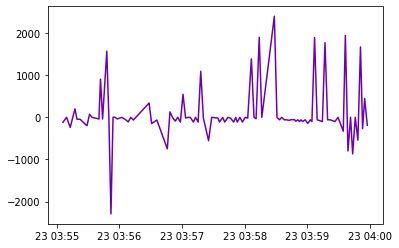

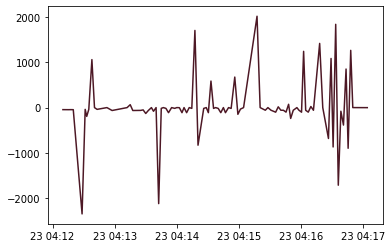

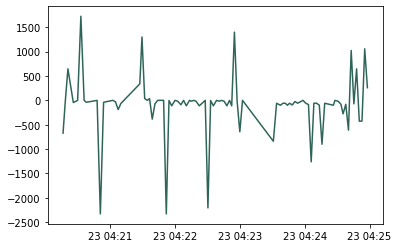

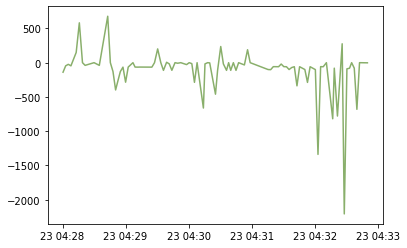

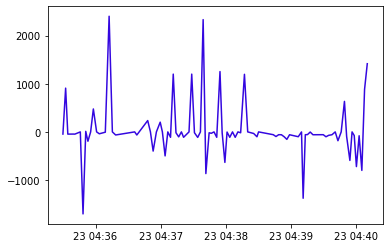

...

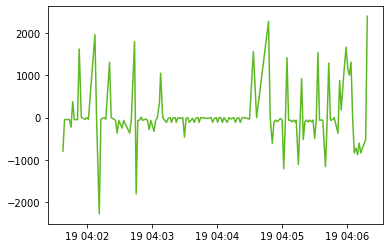

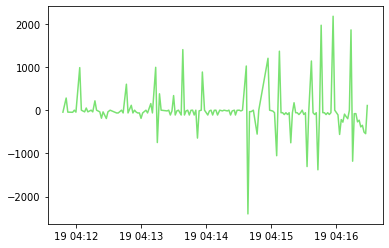

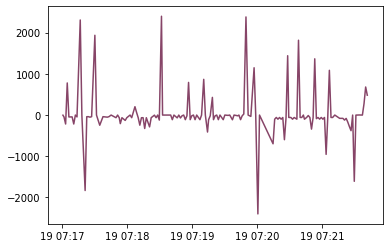

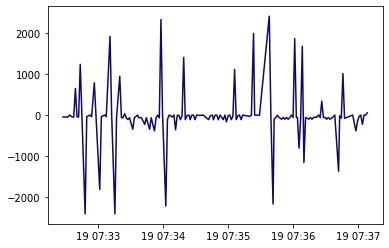

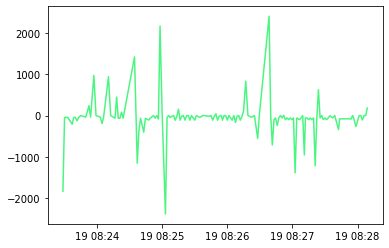

312


In [28]:
timestamp = []
signal_value = []
no_of_plots = 0
time_sequence = []
for i in range(len(main_prog)):
    if main_prog.iloc[i,5] == main_program and main_prog.iloc[i,3] >= lower_bound and main_prog.iloc[i,3] <= upper_bound:
        temp_timestamp = []
        temp_signal_value = []
        index1 = signals[(signals['updatedate'] >= main_prog.iloc[i,1])].index.to_numpy()
        index2 = signals[(signals['enddate'] <= main_prog.iloc[i,2])].index.to_numpy()
        index = np.intersect1d(index1,index2)
#         print(len(index))
        time_sequence.append(len(index))
        for j in range(len(index)):
            if len(index) !=0:
                timestamp.append(datetime.datetime.strptime(signals.iloc[index[j],1], "%Y-%m-%dT%H:%M:%S.%fZ"))
                signal_value.append(signals.iloc[index[j], 5])
                temp_timestamp.append(datetime.datetime.strptime(signals.iloc[index[j],1], "%Y-%m-%dT%H:%M:%S.%fZ"))
                temp_signal_value.append(signals.iloc[index[j], 5])
        if len(index) != 0:
            r = np.random.random()
            b = np.random.random()
            g = np.random.random()
            color = (r, g, b)
            plt.plot(temp_timestamp, temp_signal_value, color = color)
            plt.show()
            no_of_plots += 1
print(no_of_plots)

In [29]:
len(time_sequence)
timestep = sum(time_sequence)/len(time_sequence)
# print(upper_bound) #14.09.01 -> 14.09.06...??
print(timestep)

160.6006289308176


In [30]:
model_data = pd.DataFrame()
model_data['Timestamp'] = timestamp
model_data['SignalValue'] = signal_value
model_data['SignalValue'] = model_data['SignalValue'].interpolate(method='linear')

In [31]:
model_data.head()

,Timestamp,SignalValue
0,2021-03-23 03:55:06.000,-120.0
1,2021-03-23 03:55:09.500,0.0
2,2021-03-23 03:55:13.000,-240.0
3,2021-03-23 03:55:17.500,201.0
4,2021-03-23 03:55:19.500,-45.0


In [32]:
model_data.shape

(51071, 2)

In [33]:
from sklearn.model_selection import train_test_split
train, test = model_data.loc[model_data['Timestamp'] <= '2021-04-30 07:46:00.000'], model_data.loc[model_data['Timestamp'] > '2021-04-30 07:46:00.000']

In [34]:
train.head()

,Timestamp,SignalValue
0,2021-03-23 03:55:06.000,-120.0
1,2021-03-23 03:55:09.500,0.0
2,2021-03-23 03:55:13.000,-240.0
3,2021-03-23 03:55:17.500,201.0
4,2021-03-23 03:55:19.500,-45.0


In [35]:
test.head()

,Timestamp,SignalValue
41639,2021-05-05 05:22:29.500,-225.0
41640,2021-05-05 05:22:30.500,-45.0
41641,2021-05-05 05:22:31.500,-47.0
41642,2021-05-05 05:22:33.500,-46.0
41643,2021-05-05 05:22:36.500,647.0


In [36]:
train.shape,test.shape

((41639, 2), (9432, 2))

In [37]:
scaler = StandardScaler()
scaler = scaler.fit(train[['SignalValue']])
train['SignalValue'] = scaler.transform(train[['SignalValue']])
test['SignalValue'] = scaler.transform(test[['SignalValue']])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [38]:
TIME_STEPS = int(timestep)

def create_sequences(X, y, time_steps=TIME_STEPS):
    Xs, ys = [], []
    for i in range(len(X)-time_steps):
        Xs.append(X.iloc[i:(i+time_steps)].values)
        ys.append(y.iloc[i+time_steps])
    
    return np.array(Xs), np.array(ys)

X_train, y_train = create_sequences(train[['SignalValue']], train['SignalValue'])
X_test, y_test = create_sequences(test[['SignalValue']], test['SignalValue'])

In [32]:
# TIME_STEPS=median_value
# print(time_sequence)
# def create_sequences(X, y, time_steps=TIME_STEPS):
#     Xs, ys = [], []
#     sequence_start = 0
#     sequence_end = time_sequence[0]
#     for i in range(len(time_sequence)-1):
#         if i == 0:
#             print(X.iloc[sequence_start : sequence_end].values,"***\n")
#             print(y.iloc[sequence_end])
#         Xs.append(X.iloc[sequence_start : sequence_end].values)
#         ys.append(y.iloc[sequence_end])
# #         
# #             print(Xs,ys)
#         sequence_start = sequence_end + 1
#         sequence_end += time_sequence[i+1]
# #     print(len(Xs),len(ys))
#     return np.array(Xs), np.array(ys)

# X_train, y_train = create_sequences(train[['SignalValue']], train['SignalValue'])
# X_test, y_test = create_sequences(test[['SignalValue']], test['SignalValue'])

In [39]:
print(f'Training shape: {X_train.shape}')

print(f'Testing shape: {X_test.shape}')

Training shape: (41479, 160, 1)
Testing shape: (9272, 160, 1)


In [7]:
from tensorflow import keras
from tensorflow.keras import layers

In [34]:
model = Sequential()
model.add(LSTM(64, activation = 'relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences= True))
model.add(LSTM(32, activation = 'relu', return_sequences= False))
model.add(Dropout(rate=0.2))
model.add(RepeatVector(X_train.shape[1]))
model.add(LSTM(32, activation = 'relu', return_sequences = True))
model.add(LSTM(64, activation = 'relu', return_sequences=True))
model.add(Dropout(rate=0.2))
model.add(TimeDistributed(Dense(X_train.shape[2])))
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 160, 64)           16896     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 repeat_vector (RepeatVector  (None, 160, 32)          0         
 )                                                               
                                                                 
 lstm_2 (LSTM)               (None, 160, 32)           8320      
                                                                 
 lstm_3 (LSTM)               (None, 160, 64)           24832     
                                                        

In [40]:
# history = model.fit(X_train, y_train, epochs=10, batch_size=64, validation_split=0.1,
#                     callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)

Epoch 1/10
584/584 [==============================] - 144s 247ms/step - loss: 0.4697 - val_loss: 0.4471
Epoch 2/10
584/584 [==============================] - 152s 260ms/step - loss: 0.4696 - val_loss: 0.4470
Epoch 3/10
584/584 [==============================] - 152s 261ms/step - loss: 0.4695 - val_loss: 0.4468
Epoch 4/10
584/584 [==============================] - 152s 260ms/step - loss: 0.4694 - val_loss: 0.4467
Epoch 5/10
584/584 [==============================] - 151s 258ms/step - loss: 0.4693 - val_loss: 0.4466
Epoch 6/10
584/584 [==============================] - 150s 257ms/step - loss: 0.4693 - val_loss: 0.4466
Epoch 7/10
584/584 [==============================] - 150s 256ms/step - loss: 0.4693 - val_loss: 0.4465
Epoch 8/10
584/584 [==============================] - 149s 255ms/step - loss: 0.4692 - val_loss: 0.4465
Epoch 9/10
584/584 [==============================] - 351s 602ms/step - loss: 0.4692 - val_loss: 0.4465
Epoch 10/10
584/584 [==============================] - 150s 257m

In [41]:
model.save('saved_model/my_model')

INFO:tensorflow:Assets written to: saved_model/my_model\assets


INFO:tensorflow:Assets written to: saved_model/my_model\assets


In [8]:
model = keras.models.load_model('saved_model/my_model')

In [40]:
plt.plot(history.history['loss'], label='Training loss')
plt.legend();

NameError: name 'history' is not defined

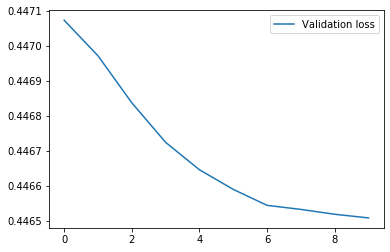

In [45]:
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend();

In [41]:
model.evaluate(X_test, y_test)

290/290 [==============================] - 20s 65ms/step - loss: 0.4705 0s - loss: 0.470


0.4705277681350708

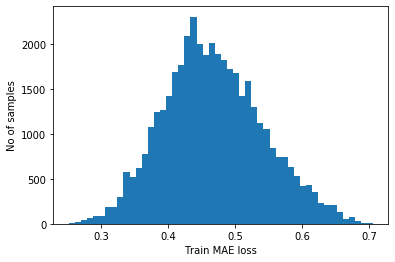

Reconstruction error threshold:  0.7056207366194134


In [42]:
x_train_pred = model.predict(X_train)
train_mae_loss = np.mean(np.abs(x_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold = np.max(train_mae_loss)
print("Reconstruction error threshold: ", threshold)

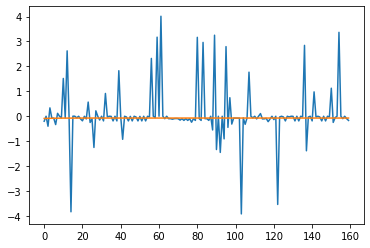

In [43]:
plt.plot(X_train[0])
plt.plot(x_train_pred[0])
plt.show()

Text(0, 0.5, 'Number of samples')

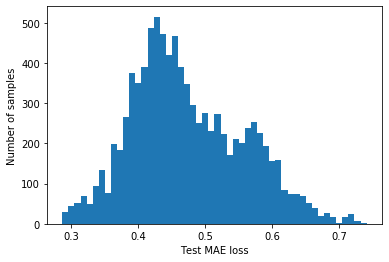

In [44]:
X_test_pred = model.predict(X_test, verbose=0)
test_mae_loss = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples')

In [45]:
test_score_df = pd.DataFrame(test[TIME_STEPS:])
test_score_df['loss'] = test_mae_loss
test_score_df['threshold'] = threshold
test_score_df['anomaly'] = test_score_df['loss'] >= test_score_df['threshold']
test_score_df['SignalValue'] = test[TIME_STEPS:]['SignalValue']

In [46]:
test_score_df.tail()

,Timestamp,SignalValue,loss,threshold,anomaly
51066,2021-05-19 08:28:03.000,0.000980,0.318196,0.705621,False
51067,2021-05-19 08:28:04.500,-0.181174,0.318747,0.705621,False
51068,2021-05-19 08:28:06.000,0.000980,0.315162,0.705621,False
51069,2021-05-19 08:28:07.500,-0.002362,0.315610,0.705621,False
51070,2021-05-19 08:28:09.000,0.303457,0.316014,0.705621,False


In [47]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=test_score_df['loss'], name='Test loss'))
fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=test_score_df['threshold'], name='Threshold'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold')
fig.show()

In [48]:
anomalies = test_score_df.loc[test_score_df['anomaly'] == True]
anomalies.head()

,Timestamp,SignalValue,loss,threshold,anomaly
45552,2021-05-17 03:28:11.000,0.000980,0.707033,0.705621,True
45554,2021-05-17 03:28:15.500,-0.186188,0.706412,0.705621,True
45736,2021-05-17 03:37:34.000,0.000980,0.712089,0.705621,True
45737,2021-05-17 03:37:38.000,-3.232680,0.712264,0.705621,True
45738,2021-05-17 03:37:39.000,-0.105973,0.731276,0.705621,True


In [49]:
anomalies.shape

(48, 5)

In [51]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=scaler.inverse_transform(test_score_df['SignalValue']), name='Servo Speed'))
fig.add_trace(go.Scatter(x=anomalies['Timestamp'], y=scaler.inverse_transform(anomalies['SignalValue']), mode='markers', name='Anomaly'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

In [60]:
# import os
# checkpoint_path = "training_2/cp-{epoch:04d}.ckpt"
# checkpoint_dir = os.path.dirname(checkpoint_path)

In [68]:
# cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
#                                                  save_weights_only=True,
#                                                  verbose=1)

# model.fit(X_train, y_train, epochs=10, batch_size=64, validation_split=0.1,
#                     callbacks=[cp_callback], shuffle=False)

Epoch 1/10
584/584 [==============================] - ETA: 0s - loss: 0.4706
Epoch 00001: saving model to training_2\cp-0001.ckpt
584/584 [==============================] - 130s 222ms/step - loss: 0.4706 - val_loss: 0.4471
Epoch 2/10
584/584 [==============================] - ETA: 0s - loss: 0.4694
Epoch 00002: saving model to training_2\cp-0002.ckpt
584/584 [==============================] - 140s 240ms/step - loss: 0.4694 - val_loss: 0.4468
Epoch 3/10
584/584 [==============================] - ETA: 0s - loss: nan
Epoch 00003: saving model to training_2\cp-0003.ckpt
584/584 [==============================] - 167s 286ms/step - loss: nan - val_loss: nan
Epoch 4/10
584/584 [==============================] - ETA: 0s - loss: nan
Epoch 00004: saving model to training_2\cp-0004.ckpt
584/584 [==============================] - 150s 256ms/step - loss: nan - val_loss: nan
Epoch 5/10
584/584 [==============================] - ETA: 0s - loss: nan
Epoch 00005: saving model to training_2\cp-0005.ckpt

KeyboardInterrupt: 

In [63]:
new_cycle1 = pd.DataFrame(columns = lst_sign ,index = t_one)
for i in range(len(t_one-1)):
    new_cycle1.at[i, signal_name] = cycle_one[i]
new_cycle1[signal_name] = new_cycle1[signal_name].fillna(0)
new_cycle1.head()

NameError: name 'lst_sign' is not defined

In [ ]:
new_cycle2 = pd.DataFrame(columns = lst_sign ,index = t_two)
for i in range(len(t_two-1)):
    new_cycle2.at[i, signal_name] = cycle_two[i]
new_cycle2[signal_name] = new_cycle2[signal_name].fillna(0)
new_cycle2.head()

In [ ]:
cycle_one_mean = new_cycle1.rolling(window = 10).mean()
cycle_two_mean = new_cycle2.rolling(window = 10).mean()

In [ ]:
cycle_one_mean = cycle_one_mean.fillna(0)
cycle_two_mean = cycle_two_mean.fillna(0)

In [ ]:
# print(cycle_one_mean.describe())
# m = np.mean(cycle_one_mean[signal_name])
# s = np.std(cycle_one_mean[signal_name])

# lower_std = s + m
# upper_std = s - m
# print(upper_std , lower_std)

In [ ]:
# for i in range(len(cycle_two_mean)):
#     if(cycle_two_mean.at[i, signal_name] > upper_std or cycle_two_mean.at[i, signal_name] < lower_std)

In [ ]:
cycle_two_mean

In [ ]:
correlate_result = np.correlate(cycle_one, cycle_two, 'full')
b_shift_positions = np.arange(-len(cycle_one) + 1, len(cycle_two))
# for i in range(len(correlate_result)):
#     print(b_shift_positions[i] , correlate_result[i])
corr_max = max(correlate_result)
print(list(correlate_result).index[int(corr_max)])
# b_shift_positions[0]

In [ ]:
plt.plot(cycle_one)
plt.show()
plt.plot(cycle_one_mean)

In [ ]:
plt.plot(cycle_two)
plt.show()
plt.plot(cycle_two_mean)

Trying fastdwt to compare two signals

In [ ]:
from scipy.spatial.distance import euclidean

from fastdtw import fastdtw
import seaborn as sbn

In [ ]:
distance, path = fastdtw(cycle_one_mean, cycle_two_mean, dist=euclidean)
print(distance)
# print(path)

In [ ]:
def compute_euclidean_distance_matrix(x, y):
#     """Calculate distance matrix
#     This method calcualtes the pairwise Euclidean distance between two sequences.
#     The sequences can have different lengths.
#     """
    dist = np.zeros((len(y), len(x)))
    for i in range(len(y)):
        for j in range(len(x)):
            dist[i,j] = (x[j]-y[i])**2
    return dist

In [ ]:
diff_distance = compute_euclidean_distance_matrix(cycle_one, cycle_two)
diff_distance

In [ ]:
diff_distance.shape

In [ ]:
def compute_accumulated_cost_matrix(x, y):
#     """Compute accumulated cost matrix for warp path using Euclidean distance
#     """
    distances = compute_euclidean_distance_matrix(x, y)

    # Initialization
    cost = np.zeros((len(y), len(x)))
    cost[0,0] = distances[0,0]
    
    for i in range(1, len(y)):
        cost[i, 0] = distances[i, 0] + cost[i-1, 0]  
        
    for j in range(1, len(x)):
        cost[0, j] = distances[0, j] + cost[0, j-1]  

    # Accumulated warp path cost
    for i in range(1, len(y)):
        for j in range(1, len(x)):
            cost[i, j] = min(
                cost[i-1, j],    # insertion
                cost[i, j-1],    # deletion
                cost[i-1, j-1]   # match
            ) + distances[i, j] 
            
    return cost

In [ ]:
cost_matrix = compute_accumulated_cost_matrix(cycle_one, cycle_two)

In [ ]:
# fig, ax = plt.subplots(figsize=(12, 8))
# ax = sbn.heatmap(cost_matrix, annot=True, square=True, linewidths=0.1, cmap="YlGnBu", ax=ax)
# ax.invert_yaxis()

# # Get the warp path in x and y directions
# path_x = [p[0] for p in warp_path]
# path_y = [p[1] for p in warp_path]

# # Align the path from the center of each cell
# path_xx = [x+0.5 for x in path_x]
# path_yy = [y+0.5 for y in path_y]

# ax.plot(path_xx, path_yy, color='blue', linewidth=3, alpha=0.2)

# fig.savefig("ex1_heatmap.png", **savefig_options)

In [ ]:
# cost_matrix